# 0. Instructions before use this notebook

##### Step01: python -m venv my_env
##### Step02: my_env\Scripts\activate
##### Step03: pip install ipykernel
##### Step04: python -m ipykernel install --user --name my_env --display-name "my_env" (run once)
##### Step05: jupyter notebook

In [1]:
# Install libraries

#!pip install pandas numpy matplotlib seaborn 
#!pip install plotly
#!pip install nbformat

In [18]:
# Import libraries

import pandas as pd
pd.set_option('display.max_rows', 50)
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib
import datetime as dt
from datetime import datetime, timedelta


import warnings
warnings.filterwarnings("ignore")

import plotly
import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as py

plotly.offline.init_notebook_mode(connected=True)

# 1. Data Cleaning

In [3]:
# Read dataset

df = pd.read_csv("ecommerce_dataset.csv", encoding="latin1")

df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df['Date'] = df['InvoiceDate'].dt.date
df['Month'] = df['InvoiceDate'].dt.month
df['Year'] = df['InvoiceDate'].dt.year

df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Date,Month,Year
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010-12-01,12,2010
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,12,2010
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010-12-01,12,2010
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,12,2010
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,12,2010


## 1.1 Removing extra StockCode (Samples, Fees, Discount, gifts, bank charges, comission)

In [19]:
# Because it is transactions dataset, there are unnecessary extras rows.

regex = "^(gift|DCGS|POST|D|C2|DOT|M|BANK CHARGES|S|AMAZONFEE|PADS|B|CRUK)"
series = df['StockCode']

df2 = df[~series.str.contains(regex)]

## 1.2 Removing negative Quantity

In [24]:
df2['Quantity'].describe()

count    538915.000000
mean          9.586100
std         218.631693
min      -80995.000000
25%           1.000000
50%           3.000000
75%          10.000000
max       80995.000000
Name: Quantity, dtype: float64

In [32]:
# Assumption: Quantity is negative when it is a return, thereby we should remove from the dataset.

df3 = df2[df2['Quantity'] > 0]
df3 = df3[df3['UnitPrice'] > 0]

In [33]:
df3.shape

(527726, 11)

In [34]:
fig = px.box(df3, y="UnitPrice")
fig.show()

In [43]:
df3[df3['UnitPrice'] > 649]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Date,Month,Year
222680,556444,22502,PICNIC BASKET WICKER 60 PIECES,60,2011-06-10 15:28:00,649.5,15098.0,United Kingdom,2011-06-10,6,2011
222682,556446,22502,PICNIC BASKET WICKER 60 PIECES,1,2011-06-10 15:33:00,649.5,15098.0,United Kingdom,2011-06-10,6,2011


## 1.3 Removing countries but United Kingdom

In [49]:
# United Kingdom represents almost entire dataset.

df3['Country'].value_counts(normalize = True)[:10] 

United Kingdom    0.917090
Germany           0.016406
France            0.015349
EIRE              0.014741
Spain             0.004590
Netherlands       0.004400
Belgium           0.003667
Switzerland       0.003667
Portugal          0.002774
Australia         0.002238
Name: Country, dtype: float64

In [51]:
df4 = df3[df3['Country'] == "United Kingdom"]
df4.shape

(483972, 11)

##  1.4 Removing CustormerID missing

In [109]:
# Percentual of missing values

df4.isna().mean().round(4) * 100

InvoiceNo       0.00
StockCode       0.00
Description     0.00
Quantity        0.00
InvoiceDate     0.00
UnitPrice       0.00
CustomerID     26.86
Country         0.00
Date            0.00
Month           0.00
Year            0.00
dtype: float64

In [110]:
df5 = df4.dropna()
df5.shape

(353985, 11)

##  1.5 Removing Products with less than 10 examples

In [111]:
freq_Stock = df5.groupby(['StockCode'])['StockCode'].agg('count').to_frame()
freq_Stock.columns = ['count']
freq_Stock = freq_Stock.reset_index()
freq_Stock = freq_Stock.sort_values(['count'], ascending = False)
freq_Stock

,StockCode,count
3229,85123A,1947
3215,85099B,1464
1286,22423,1426
3056,84879,1333
2591,47566,1307
...,...,...
3367,90024C,1
3368,90024D,1
3369,90024F,1
3371,90025F,1


In [112]:
# Removendo linhas com menos de 10 examplos
remove_Stock = freq_Stock[freq_Stock['count'] < 10]['StockCode']
df6 = df5[~df5['StockCode'].isin(remove_Stock)]

In [113]:
df6.shape

(350669, 11)

# 2. Outliers

In [114]:
# Values extremely different from others.

%%timeit

def remove_outilers(df):
    '''This function only keep values from its mean minus a standard deviation to
    mean plus a standard deviation by Country and Product.
    
    Input: dataframe
    Output: dataframe
    '''
    df_out = pd.DataFrame()
    for key, subdf in df.groupby(['Country', 'StockCode']):
        m = np.mean(subdf.UnitPrice)
        st = np.std(subdf.UnitPrice)
        reduced_df = subdf[(subdf.UnitPrice > (m-st)) & (subdf.UnitPrice <= (m+st))]
        df_out = pd.concat([df_out, reduced_df], ignore_index=True)
    return df_out

df7 = remove_outilers(df6)

In [115]:
df7.shape

(309063, 11)

In [116]:
fig = px.box(df7, y="UnitPrice")
fig.show()

## In summary, UnitPrice variable has a lot variation due to selling WOODEN PENCIL to DRAWER SIDEBOARD

In [117]:
df7[df7['UnitPrice'] == 165].head(2)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Date,Month,Year
176433,536392,22827,RUSTIC SEVENTEEN DRAWER SIDEBOARD,1,2010-12-01 10:29:00,165.0,13705.0,United Kingdom,2010-12-01,12,2010
176434,540970,22827,RUSTIC SEVENTEEN DRAWER SIDEBOARD,1,2011-01-12 13:52:00,165.0,14185.0,United Kingdom,2011-01-12,1,2011


In [118]:
df7[df7['UnitPrice'] == 0.04].head(2)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Date,Month,Year
1795,555876,16045,POPART WOODEN PENCILS ASST,100,2011-06-07 15:28:00,0.04,15799.0,United Kingdom,2011-06-07,6,2011
1796,556267,16045,POPART WOODEN PENCILS ASST,500,2011-06-09 19:33:00,0.04,13694.0,United Kingdom,2011-06-09,6,2011


# 3. Descriptive Statistics

## 3.1 Top 10 products (Quantity x UnitPrice)

In [134]:
df8 = df7.groupby(['Description', 'UnitPrice'])['Quantity'].agg(np.sum).reset_index()

df8['Total'] = df8['Quantity'] * df8['UnitPrice']
df8 = df8.sort_values(['Total'], ascending = False)
df8 = df8[:10]

fig = px.bar(df8, x='Description', y='Total')
fig.show()

## 3.2 Top 10 clients (Quantity x UnitPrice)

In [153]:
df9 = df7.groupby(['CustomerID']).agg({'Quantity': np.sum, 'UnitPrice': np.mean}).reset_index()

df9['Total'] = df9['Quantity'] * df9['UnitPrice']
df9 = df9.sort_values(['Total'], ascending = False)
df9 = df9[:10]
df9['CustomerID'] = df9['CustomerID'].astype('int')

df9['CustomerID'] =  df9['CustomerID'].astype('object')
df9['CustomerID'] =  df9['CustomerID'].apply(lambda x: "Client " + str(x))   
    
fig = px.bar(df9, x='CustomerID', y='Total')
fig.show()

## 3.3 Sales (Quantity x UnitPrice) by year

In [184]:
df10 = df7.groupby(['Month', 'Year']).agg({'Quantity': np.sum, 'UnitPrice': np.mean}).reset_index()

df10['Total'] = df10['Quantity'] * df10['UnitPrice']
df10 = df10.sort_values(['Year', 'Month'], ascending = True)



meses= df10[1:].Month
last_value = df10.loc[df10['Year'] == 2010, :]['Total']
last_value = last_value.to_list()
ini_value = [0 for i in range(11)]

fig = go.Figure(data=[
    go.Bar(name='2010', x=meses, y= ini_value + last_value),
    go.Bar(name='2011', x=meses, y= df10[1:].Total.to_list())
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()


# 4. Time Cohort

## 4.1 Retention rate

In [205]:
def get_month(x): return dt.datetime(x.year, x.month, 1)

df11 = df7.copy()

df11['InvoiceMonth'] = df7['InvoiceDate'].apply(get_month)

grouping = df11.groupby('CustomerID')['InvoiceMonth']

df11['CohortMonth'] = grouping.transform('min')
df11.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Date,Month,Year,InvoiceMonth,CohortMonth
0,557568,10080,GROOVY CACTUS INFLATABLE,48,2011-06-21 10:40:00,0.39,17629.0,United Kingdom,2011-06-21,6,2011,2011-06-01,2010-12-01
1,558911,10080,GROOVY CACTUS INFLATABLE,12,2011-07-05 09:23:00,0.39,14189.0,United Kingdom,2011-07-05,7,2011,2011-07-01,2010-12-01
2,561322,10080,GROOVY CACTUS INFLATABLE,12,2011-07-26 13:03:00,0.39,15203.0,United Kingdom,2011-07-26,7,2011,2011-07-01,2011-02-01
3,561925,10080,GROOVY CACTUS INFLATABLE,12,2011-08-01 12:28:00,0.39,16551.0,United Kingdom,2011-08-01,8,2011,2011-08-01,2011-01-01
4,562044,10080,GROOVY CACTUS INFLATABLE,24,2011-08-02 10:24:00,0.39,16607.0,United Kingdom,2011-08-02,8,2011,2011-08-01,2010-12-01


In [206]:
def get_date_int(df, column):
    year = df[column].dt.year
    month = df[column].dt.month
    day = df[column].dt.day
    return year, month, day



invoice_year, invoice_month, _ = get_date_int(df11, 'InvoiceMonth')
cohort_year, cohort_month, _ = get_date_int(df11, 'CohortMonth')


years_diff = invoice_year - cohort_year
months_diff = invoice_month - cohort_month


df11['CohortIndex'] = years_diff * 12 + months_diff + 1 # convert to month

df11.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Date,Month,Year,InvoiceMonth,CohortMonth,CohortIndex
0,557568,10080,GROOVY CACTUS INFLATABLE,48,2011-06-21 10:40:00,0.39,17629.0,United Kingdom,2011-06-21,6,2011,2011-06-01,2010-12-01,7
1,558911,10080,GROOVY CACTUS INFLATABLE,12,2011-07-05 09:23:00,0.39,14189.0,United Kingdom,2011-07-05,7,2011,2011-07-01,2010-12-01,8
2,561322,10080,GROOVY CACTUS INFLATABLE,12,2011-07-26 13:03:00,0.39,15203.0,United Kingdom,2011-07-26,7,2011,2011-07-01,2011-02-01,6
3,561925,10080,GROOVY CACTUS INFLATABLE,12,2011-08-01 12:28:00,0.39,16551.0,United Kingdom,2011-08-01,8,2011,2011-08-01,2011-01-01,8
4,562044,10080,GROOVY CACTUS INFLATABLE,24,2011-08-02 10:24:00,0.39,16607.0,United Kingdom,2011-08-02,8,2011,2011-08-01,2010-12-01,9


In [207]:
grouping = df11.groupby(['CohortMonth', 'CohortIndex'])
cohort_data = grouping['CustomerID'].apply(pd.Series.nunique)
cohort_data = cohort_data.reset_index()

cohort_counts = cohort_data.pivot(index = 'CohortMonth',
                                 columns = 'CohortIndex',
                                 values = 'CustomerID')


cohort_counts.index = cohort_counts.index.astype('str')

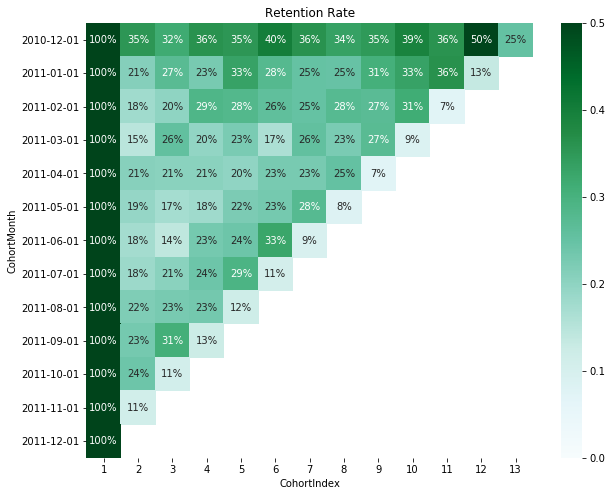

In [219]:
# compare over time as well as across cohorts

cohort_sizes = cohort_counts.iloc[:,0] # select first column

retention = cohort_counts.divide(cohort_sizes, axis = 0) 


plt.figure(figsize=(10,8))

plt.title('Retention Rate')

sns.heatmap(data = retention,
           annot = True,
           fmt = '.0%',
           vmin=0.0,
           vmax =0.5,
           cmap='BuGn')

# 5. Segmentation

## 5.1 RFM Segmentation

#### Recency (R): days since last customer transaction
#### Frequency (F): number of transactions in the last 12 months
#### Monetary Value (M): total spend in the last 12 months

In [236]:
df12 = df11[df11['CohortMonth'] != "2010-12-01"] # only keep last 12 months

snapshot_date = max(df12.InvoiceDate) + timedelta(days=1)
snapshot_date

Timestamp('2011-12-10 12:31:00')

In [244]:
df12['TotalSum'] = df12['Quantity'] * df12['UnitPrice']

datamart = df12.groupby(['CustomerID']).agg({
    'InvoiceDate': lambda x: (snapshot_date - x.max()).days,
    'InvoiceNo': 'count',
    'TotalSum': 'sum'})

datamart.rename(columns = {'InvoiceDate': 'Recency',
                          'InvoiceNo': 'Frequency',
                          'TotalSum': 'MonetaryValue'}, inplace = True)

datamart.head()

,Recency,Frequency,MonetaryValue
CustomerID,,,
12749.0,4,193,3944.48
12820.0,3,57,920.50
12821.0,214,6,92.72
12822.0,71,43,827.52
12823.0,75,5,1759.50


In [247]:
r_labels = range(4, 0, -1)

r_quartiles = pd.qcut(datamart['Recency'], 4, labels=r_labels)
datamart = datamart.assign(R = r_quartiles.values)

f_labels = range(1,5)
m_labels = range(1,5)

f_quartiles = pd.qcut(datamart['Frequency'], 4, labels=f_labels)
m_quartiles = pd.qcut(datamart['MonetaryValue'], 4, labels=m_labels)

datamart = datamart.assign(F = f_quartiles.values)
datamart = datamart.assign(M = m_quartiles.values)


def join_rfm(x): return str(x['R']) + str(x['F']) + str(x['M']) 

datamart['RFM_Segment'] = datamart.apply(join_rfm, axis = 1)
datamart['RFM_Score'] = datamart[['R', 'F', 'M']].sum(axis=1)

datamart.head()

,Recency,Frequency,MonetaryValue,R,F,M,RFM_Segment,RFM_Score
CustomerID,,,,,,,,
12749.0,4,193,3944.48,4,4,4,444,12.0
12820.0,3,57,920.50,4,3,3,433,10.0
12821.0,214,6,92.72,1,1,1,111,3.0
12822.0,71,43,827.52,2,3,3,233,8.0
12823.0,75,5,1759.50,2,1,4,214,7.0


In [248]:
datamart.groupby('RFM_Score').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'MonetaryValue': ['mean', 'count']
}).round(1)

Recency Frequency MonetaryValue      
             mean      mean          mean count
RFM_Score                                      
3.0         242.1       6.7         119.4   275
4.0         157.4      10.2         171.3   255
5.0         146.1      15.6         250.3   353
6.0          95.5      21.0         358.5   352
7.0          83.9      29.8         455.3   298
8.0          62.7      40.5         629.2   346
9.0          53.0      57.3         894.2   301
10.0         37.8      87.8        1232.2   335
11.0         24.8     131.3        1898.2   283
12.0          8.9     214.5        2806.1   268

In [249]:
def segment_me(df):
    if df['RFM_Score'] >= 9:
        return 'Gold'
    elif (df['RFM_Score'] >= 5) and (df['RFM_Score'] < 9):
        return 'Silver'
    else:
        return 'Bronze'
    

datamart['General_Segment'] = datamart.apply(segment_me, axis = 1)


datamart.groupby('General_Segment').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'MonetaryValue': ['mean', 'count']
}).round(1)


Recency Frequency MonetaryValue      
                   mean      mean          mean count
General_Segment                                      
Bronze            201.4       8.4         144.4   530
Gold               32.0     119.0        1660.6  1187
Silver             97.8      26.5         421.0  1349